**GROUP 18 PROJECT PROPOSAL**

**INTRODUCTION**

The sport of tennis provides an exhilarating watch due to an abundance of high pressure moments, many of which come at break points. This is when a player is on the last point to win a game in a set in which their opponent is serving. Winning these gives a player a colossal advantage, whereas if the opponent that serves saves break points and does not concede games, the tide of the game may shift. Similarly, hitting serves that an opponent is unable to return is considered an ace and are vital to win points quickly. This investigation aims to predict the likelihood of a player winning a game based on the number of aces they hit, and the ratio between the amount break points they save to the amount that they face. To do so, data with statistics and outcomes of all ATP (Association of Tennis Professionals) officiated matches between 2017 and 2019 will be used to create data points of each winner and loser, their break point ratios, and the number of aces they hit.

**PRELIMINARY EXLORATORY DATA ANALYSIS**

**Loading the dataset**

In [2]:
library(tidyverse)
library(tidymodels)

tennis_data <- read.csv("atp2017-2019.csv")
tennis_data

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

X,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,⋯,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,2019-M020,Brisbane,Hard,32,A,20181231,300,105453,2,⋯,54,34,20,14,10,15,9,3590,16,1977
1,2019-M020,Brisbane,Hard,32,A,20181231,299,106421,4,⋯,52,36,7,10,10,13,16,1977,239,200
2,2019-M020,Brisbane,Hard,32,A,20181231,298,105453,2,⋯,27,15,6,8,1,5,9,3590,40,1050
3,2019-M020,Brisbane,Hard,32,A,20181231,297,104542,,⋯,60,38,9,11,4,6,239,200,31,1298
4,2019-M020,Brisbane,Hard,32,A,20181231,296,106421,4,⋯,56,46,19,15,2,4,16,1977,18,1855
5,2019-M020,Brisbane,Hard,32,A,20181231,295,104871,,⋯,54,40,18,15,6,9,40,1050,185,275
6,2019-M020,Brisbane,Hard,32,A,20181231,294,105453,2,⋯,53,37,13,12,6,9,9,3590,19,1835
7,2019-M020,Brisbane,Hard,32,A,20181231,293,104542,,⋯,51,34,11,11,6,11,239,200,77,691
8,2019-M020,Brisbane,Hard,32,A,20181231,292,200282,7,⋯,39,30,3,9,3,6,31,1298,72,715


**Cleaning and wrangling the data to a tidy format**

In [3]:
#select the column needed for data analysis
tennis_select <- select(tennis_data, winner_name, loser_name, w_ace, l_ace, w_bpSaved, l_bpSaved, w_bpFaced, l_bpFaced) 
tennis_select

winner_name,loser_name,w_ace,l_ace,w_bpSaved,l_bpSaved,w_bpFaced,l_bpFaced
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Kei Nishikori,Daniil Medvedev,3,8,3,10,6,15
Daniil Medvedev,Jo Wilfried Tsonga,10,17,0,10,1,13
Kei Nishikori,Jeremy Chardy,2,10,2,1,2,5
Jo Wilfried Tsonga,Alex De Minaur,12,1,4,4,5,6
Daniil Medvedev,Milos Raonic,12,29,8,2,8,4
Jeremy Chardy,Yasutaka Uchiyama,10,12,4,6,8,9
Kei Nishikori,Grigor Dimitrov,5,8,0,6,1,9
Jo Wilfried Tsonga,Taro Daniel,11,3,4,6,7,11
Alex De Minaur,Jordan Thompson,1,5,0,3,0,6


The dataset above contains the number of aces, number of breakpoints saved and number of breakpoints faced for both a winner and loser in a single row. We want to make a row including the number of aces, the number of breakpoints saved and the number of breakpoints faced for only 1 player. Therefore, from this dataset, we create 2 seperate dataframes called "tennis_select_w", consisting of the figures of the winning player in a match, and "tennis_select_l", consisting of the figures of the losing player in a match 

In [15]:
tennis_select_w <- select(tennis_data, winner_name, w_ace, w_bpSaved,  w_bpFaced) |>
    mutate(bpSaveoverpercentage = w_bpSaved/w_bpFaced)|>
    rename(name=winner_name, ace=w_ace, bpSaved=w_bpSaved, bpFaced=w_bpFaced) |>
    mutate(result = 1)
#players who faced zero bp will be excluded from the data
tennis_select_w

name,ace,bpSaved,bpFaced,bpSaveoverpercentage,result
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Kei Nishikori,3,3,6,0.5000000,1
Daniil Medvedev,10,0,1,0.0000000,1
Kei Nishikori,2,2,2,1.0000000,1
Jo Wilfried Tsonga,12,4,5,0.8000000,1
Daniil Medvedev,12,8,8,1.0000000,1
Jeremy Chardy,10,4,8,0.5000000,1
Kei Nishikori,5,0,1,0.0000000,1
Jo Wilfried Tsonga,11,4,7,0.5714286,1
Alex De Minaur,1,0,0,NaN,1


In [16]:
tennis_select_l <- select(tennis_data,loser_name, l_ace,  l_bpSaved, l_bpFaced) |>
    mutate(bpSaveoverpercentage = l_bpSaved/l_bpFaced)|>
    rename(name=loser_name, ace=l_ace, bpSaved=l_bpSaved, bpFaced=l_bpFaced) |>
    mutate(result = 0)
tennis_select_l

name,ace,bpSaved,bpFaced,bpSaveoverpercentage,result
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Daniil Medvedev,8,10,15,0.6666667,0
Jo Wilfried Tsonga,17,10,13,0.7692308,0
Jeremy Chardy,10,1,5,0.2000000,0
Alex De Minaur,1,4,6,0.6666667,0
Milos Raonic,29,2,4,0.5000000,0
Yasutaka Uchiyama,12,6,9,0.6666667,0
Grigor Dimitrov,8,6,9,0.6666667,0
Taro Daniel,3,6,11,0.5454545,0
Jordan Thompson,5,3,6,0.5000000,0


After dividing into 2 different dataframes, we decide to combine them to make a tidy dataset. To do this, we need the columns to have the exact same name. That's the reason we rename the columns of both 2 datasets to be identical. Additionally, to differentiate between the winning and losing player, we create a new column call "result", with 1 assigned to the winning player and 0 assigned to the losing player

In [17]:
tennis_combined_data <- rbind(tennis_select_w, tennis_select_l) |> mutate (result = as.factor(result))
tennis_combined_data

name,ace,bpSaved,bpFaced,bpSaveoverpercentage,result
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
Kei Nishikori,3,3,6,0.5000000,1
Daniil Medvedev,10,0,1,0.0000000,1
Kei Nishikori,2,2,2,1.0000000,1
Jo Wilfried Tsonga,12,4,5,0.8000000,1
Daniil Medvedev,12,8,8,1.0000000,1
Jeremy Chardy,10,4,8,0.5000000,1
Kei Nishikori,5,0,1,0.0000000,1
Jo Wilfried Tsonga,11,4,7,0.5714286,1
Alex De Minaur,1,0,0,NaN,1


**Splitting the data**

In [18]:
#set seed
set.seed(2024)

tennis_combined_data_split <- tennis_combined_data |> 
                              initial_split(prop = 0.75, strata = result)
tennis_combined_training_data <- training(tennis_combined_data_split)
tennis_combined_testing_data <- testing(tennis_combined_data_split)

**Summary of training data**

In [19]:
#Display the number of observations for each class
observation_count <- tennis_combined_training_data |>
                     group_by(result) |>
                     summarize(observations = n())
observation_count

result,observations
<fct>,<int>
0,5149
1,5149


In [20]:
#Display the number of NA values 
NA_count <- colSums(is.na(tennis_combined_training_data))
NA_count        

name                  ace              bpSaved 
                   0                  123                  123 
             bpFaced bpSaveoverpercentage               result 
                 123                  663                    0

In [21]:
#Display the average value of predictor variables
average_count <- tennis_combined_training_data |>
                 group_by(result) |>
                 summarize(across(ace:bpSaveoverpercentage, ~ mean(.x, na.rm = TRUE)))
average_count

result,ace,bpSaved,bpFaced,bpSaveoverpercentage
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
0,5.751475,4.77094,8.469524,0.5167106
1,7.458047,3.43486,4.978974,0.6646844


**Visualization of the training data**

Warning message:
“Removed 784 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 112 rows containing missing values (`geom_point()`).”


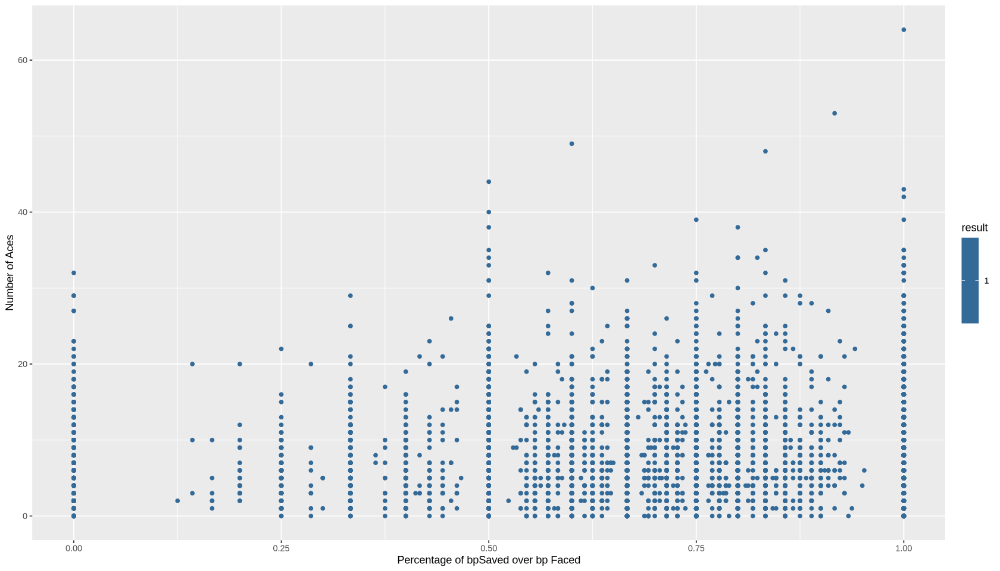

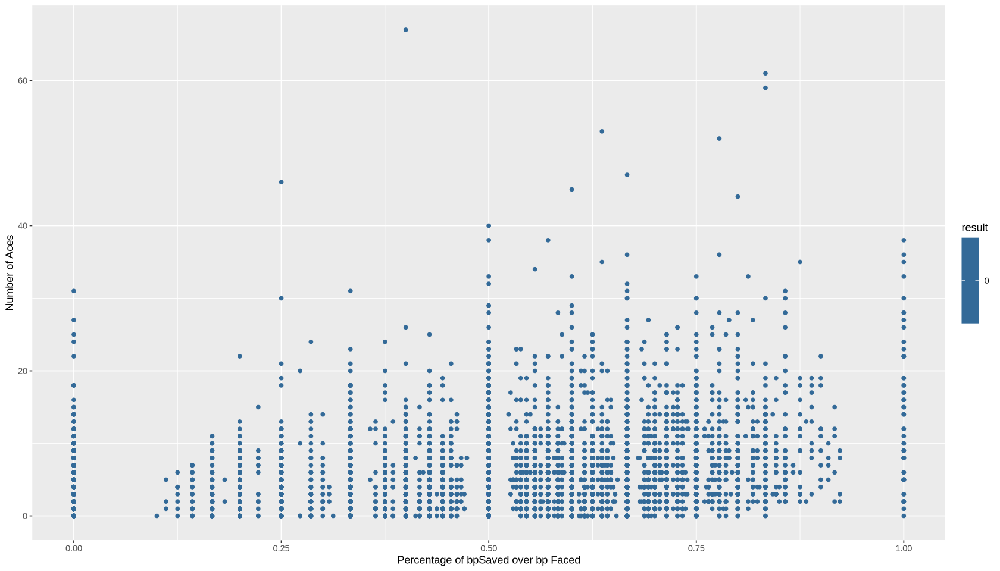

In [22]:
tennis_l_plot <- tennis_select_l |>
                 ggplot(aes(x = bpSaveoverpercentage, y = ace))+
                 geom_point(aes(colour = result)) +
                 labs(x= "Percentage of bpSaved over bp Faced", 
                      y="Number of Aces", 
                      colour="result")

tennis_w_plot <- tennis_select_w |>
                 ggplot(aes(x = bpSaveoverpercentage, y = ace))+
                 geom_point(aes(colour = result)) +
                 labs(x= "Percentage of bpSaved over bp Faced", 
                      y="Number of Aces", 
                      colour="result")

tennis_w_plot
tennis_l_plot

Warning message:
“Removed 896 rows containing missing values (`geom_point()`).”


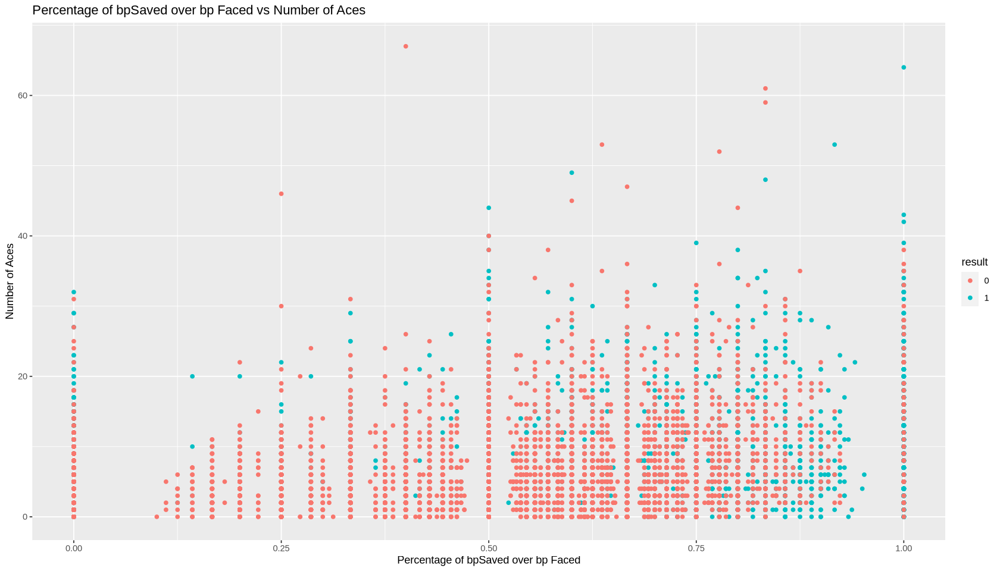

In [23]:
tennis_combined_plot <- tennis_combined_data |>
                        ggplot(aes(x = bpSaveoverpercentage, y = ace)) +
                        geom_point(aes(colour = result)) +
                        labs(x= "Percentage of bpSaved over bp Faced", 
                             y="Number of Aces", 
                             colour="result") +
                        ggtitle("Percentage of bpSaved over bp Faced vs Number of Aces")

options(repr.plot.width = 14, repr.plot.height = 8)

tennis_combined_plot

**METHODS**

The data set “atp2017-2019.csv” contains data on each match, with columns for each winner and loser and their statistics for break points saved, faced, and aces hit. These will be the classifiers to formulate the predictions- hence being the only relevant and useful columns. The predictor will be formulated using the k-nearest neighbours classification, relying on proximity. Therefore, a scatter plot is the most appropriate way to visualise the results, plotting break point save percentage against number of aces of each player. The player winning or losing will be used to colour each point. It is anticipated that players with more aces and a better break point save percentage will be more likely to win, as this suggest they accumulate points quickly and gain key points in high-pressure situations.

**EXPECTED OUTCOME AND SIGNIFICANCE**

It is expected that this predictor can find whether a player was victorious based on their percentage of break points saved and number of aces. Logically, such data would be useful to performance coaches to highlight areas of focus to players. If this data set highlights that more aces lead to more wins, coaches may have their players practise serving more. Similarly, by formulating a way to predict future outcomes based on historical statistics, sports bettors may benefit as they could predict winners of future games more accurately. Such an investigation may prompt further study into other factors determining win likelihood such as double faults or winning the first set.